In [1]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import kktk

In [2]:
sc.settings.set_figure_params(dpi=80)

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

def plot(adata, section_col, predicted_label_col, nrows, ncols, size=10, figsize=(12, 4)):
    samples = sorted(adata.obs[section_col].unique())
    niches = adata.obs[predicted_label_col].cat.categories
    
    for niche in niches:
        # Create binary annotation
        adata.obs["highlight_niche"] = np.where(
            adata.obs[predicted_label_col] == niche,
            niche,
            "Other"
        )
        
        fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
        axes = axes.flatten()
        
        for i, sample in enumerate(samples):
            ax = axes[i]
            slide = adata[adata.obs[section_col] == sample].copy()
        
            sc.pl.embedding(
                slide,
                basis="spatial",
                color="highlight_niche",
                palette={niche: "#722F37", "Other": "lightgrey"},
                ax=ax,
                show=False,
                title=sample,
                size=size
            )
        
            # remove legend per subplot
            if ax.get_legend() is not None:
                ax.get_legend().remove()
        
            ax.set_aspect("equal")
        
        # turn off unused panels
        for j in range(len(samples), 3):
            axes[j].axis("off")
        
        # global title
        fig.suptitle(niche, fontsize=20, y=0.98)
        
        plt.tight_layout()
        plt.show()

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_section_guide(slide):
    xy = slide.obsm["spatial"]

    plt.figure(figsize=(5, 5))
    sns.scatterplot(
        x=xy[:, 0],
        y=xy[:, 1],
        s=1,
        linewidth=0
    )

    plt.gca().invert_yaxis()  # important for image coordinates
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("Section footprint")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

# Read in adata

In [6]:
adata = sc.read_h5ad("/Users/kazumasakanemaru/GitHub/TissueTypist/results/eval_merfish_demo/merfish_predicted_cells.h5ad")
adata

AnnData object with n_obs × n_vars = 228635 × 238
    obs: 'sample_id', 'batch', 'n_counts', 'leiden', 'zone_cluster', 'communities', 'complexity', 'populations', 'purity', 'sliding_window_assignment', 'tt_coarse_label', 'tt_coarse_score', 'tt_fine_label', 'tt_fine_score', 'tt_joint_score', 'tt_final_label', 'tt_low_conf', 'tt_stage2a_score', 'tt_vasc2a_score', 'tt_ventricle_label', 'tt_ventricle_score', 'tt_avjunction_label', 'tt_avjunction_score', 'tt_atrium_split_label', 'tt_atrium_split_score', 'tt_atrium_transitional_label', 'tt_atrium_transitional_score', 'tt_atrium_lr_label', 'tt_atrium_lr_score', 'tt_pcs_split_label', 'tt_pcs_split_score', 'tt_pcs_sinoatrial_label', 'tt_pcs_sinoatrial_score', 'tt_vasc_split_label', 'tt_vasc_split_score', 'tt_vasc_fine_label', 'tt_vasc_fine_score'
    uns: 'communities_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'populations_colors', 'sample_id_colors', 'umap', 'zone_cluster_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'P

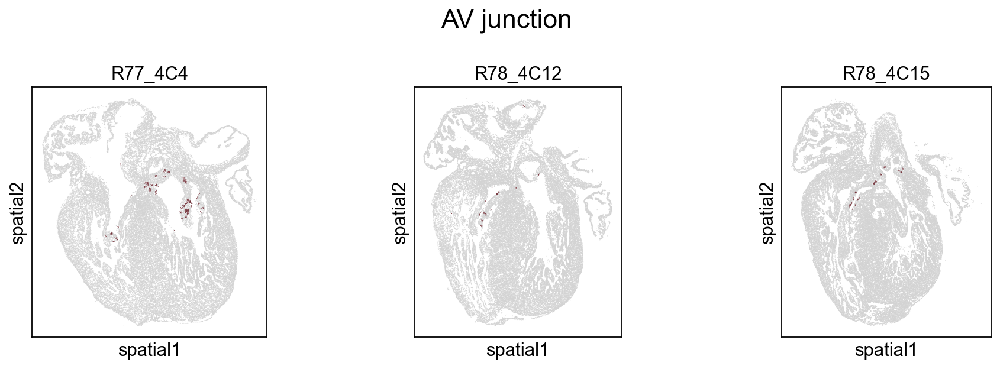

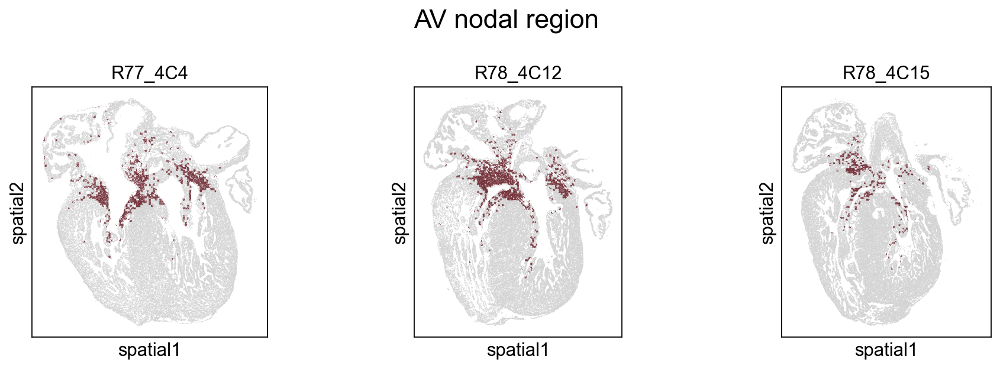

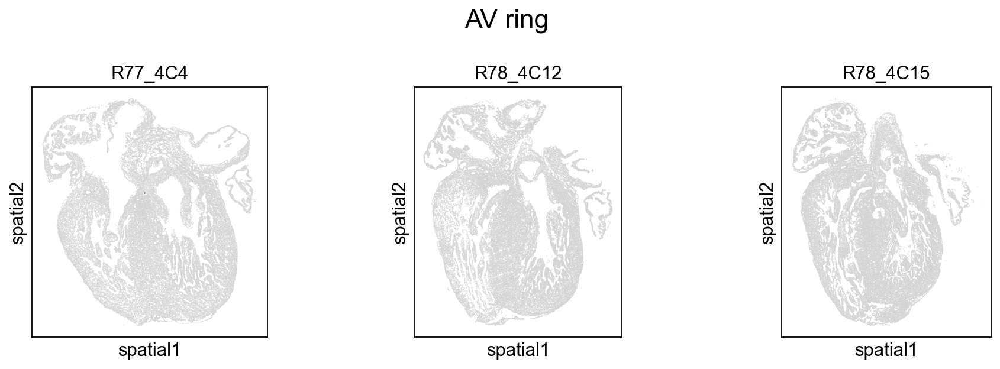

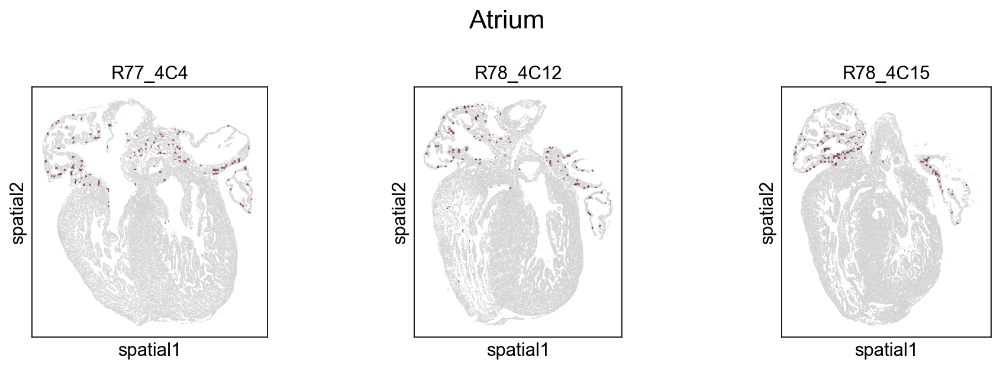

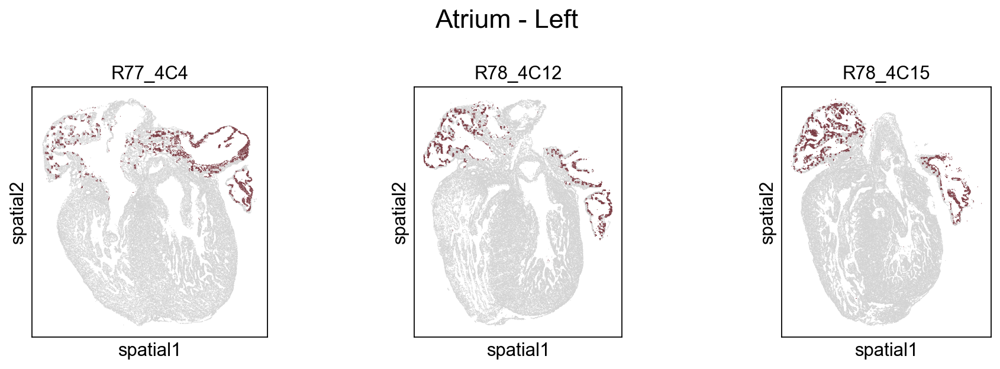

...

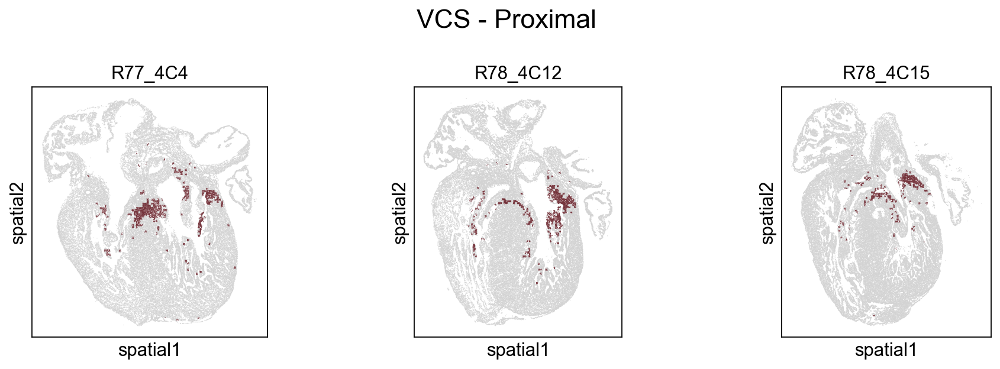

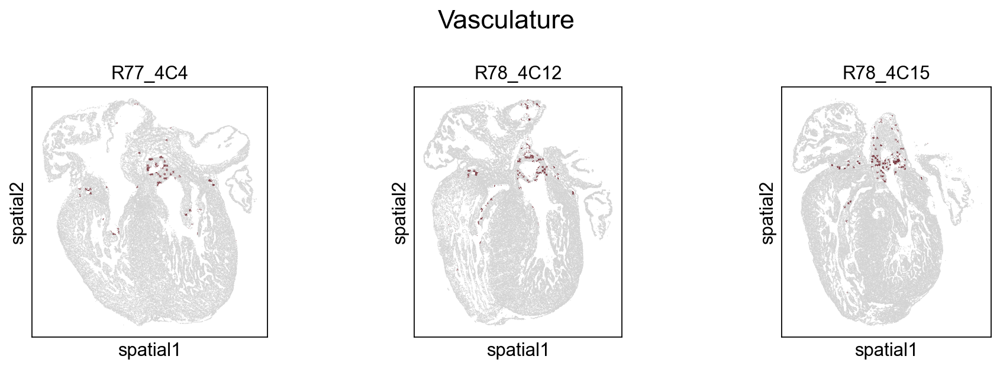

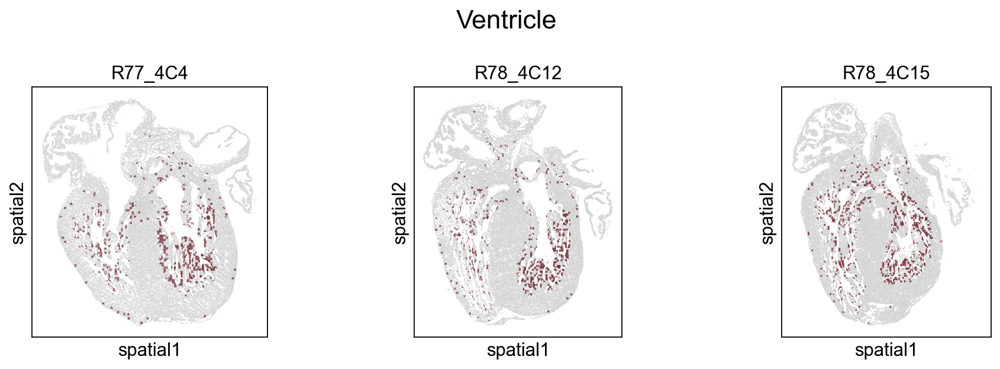

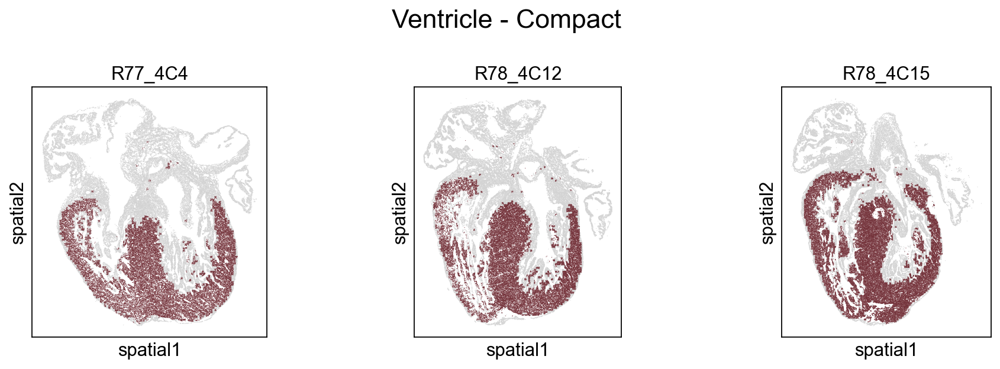

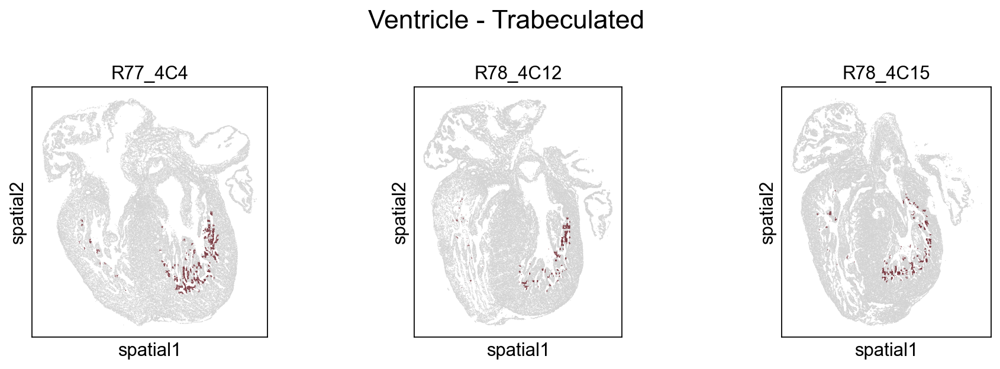

In [7]:
plot(adata, 
    section_col = "sample_id",
     predicted_label_col = 'tt_final_label',
     size = 1,
     nrows = 1, ncols = 3, figsize=(12, 4)
    )

# Plotting

In [12]:
palette_niches = {
    'Atrium - Left': '#1f77b4',
    'Atrium - Right': '#ff7f0e',
    'Atrium - Transitional': '#2ca02c',

    'Sinus horn': '#d62728',
    'SA node - Head': '#9467bd',
    'SA node - Tail': '#8c564b',
    'AV nodal region': '#e377c2',
    'AV ring': '#f7b6d2',

    'Endocardial cushion - Valve': '#7f7f7f',

    'Ventricle - Compact': '#bcbd22',
    'Ventricle - Trabeculated': '#17becf',

    'VCS - Proximal': '#aec7e8',
    'VCS - Distal': '#ffbb78',

    'Endocardium - Atrial': '#c7e9c0', 
    'Endocardium - Ventricular': '#98df8a',

    'Great vessel': '#ff9896',
    'Ductus arteriosus': '#c5b0d5',
    'Coronary vessel': '#c49c94',

    'Connective tissue': '#f7b6d2',
    'Epicardial region': '#c7c7c7',
}


In [15]:
# remove intermediate terms (falled back labels)
ndata = adata[adata.obs["tt_final_label"].isin([
    'AV junction',
 'Atrium',                            
 'Great vessels',
 'Lymph node',
 'Pacemaker conduction system',
    'Sinoatrial region',
 'Vasculature',
 'Ventricle'])==False]
ndata.shape

(194191, 238)

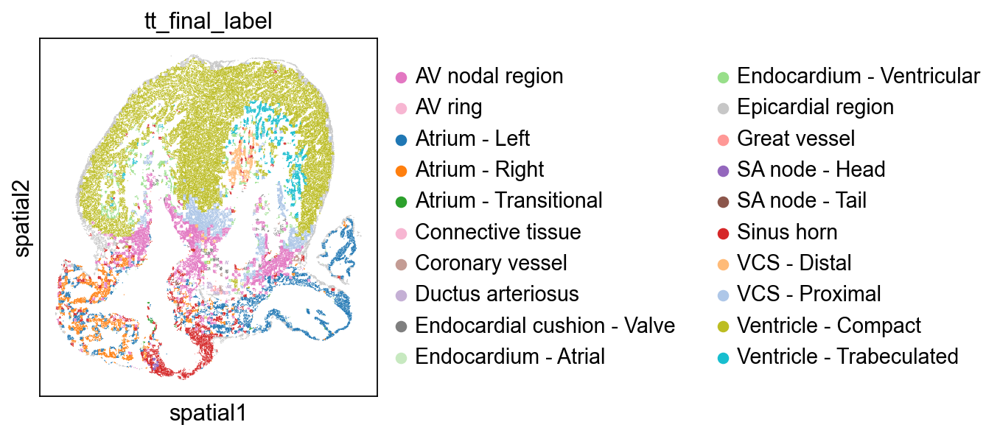

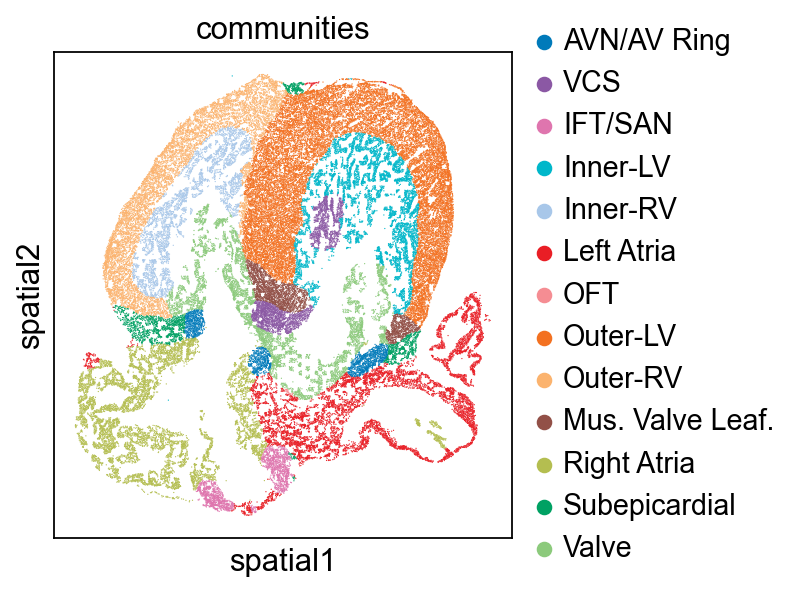

In [16]:
section_id = 'R77_4C4'
slide = ndata[ndata.obs["sample_id"] == section_id].copy()

sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                show=False,
                # title=sample,
                spot_size=15
            )
plt.savefig(f'{figdir}/MERFISH_whole-heart_TT-niche-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

sc.pl.spatial(
                slide,
                color="communities", # palette = palette_niches,
                show=False,
                # title=sample,
                spot_size=15
            )
plt.savefig(f'{figdir}/MERFISH_whole-heart_communities-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

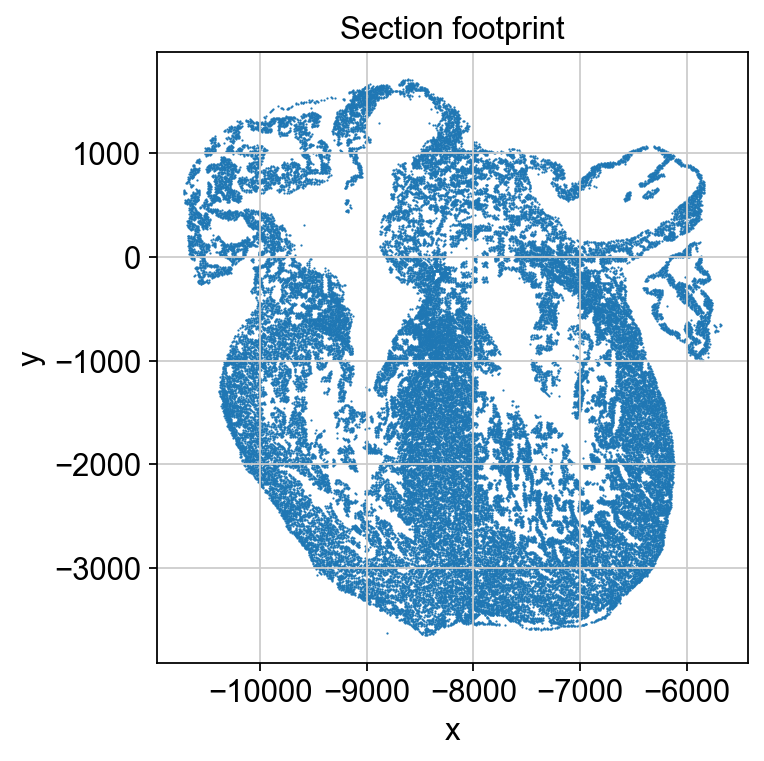

In [17]:
plot_section_guide(slide)

[<Axes: title={'center': 'R77_4C4'}, xlabel='spatial1', ylabel='spatial2'>]

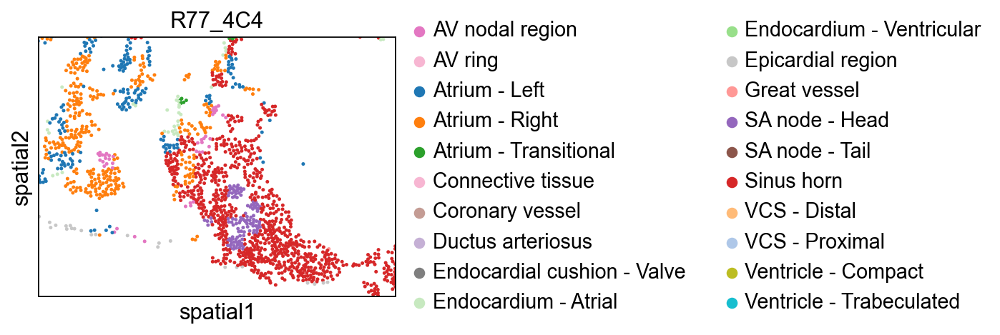

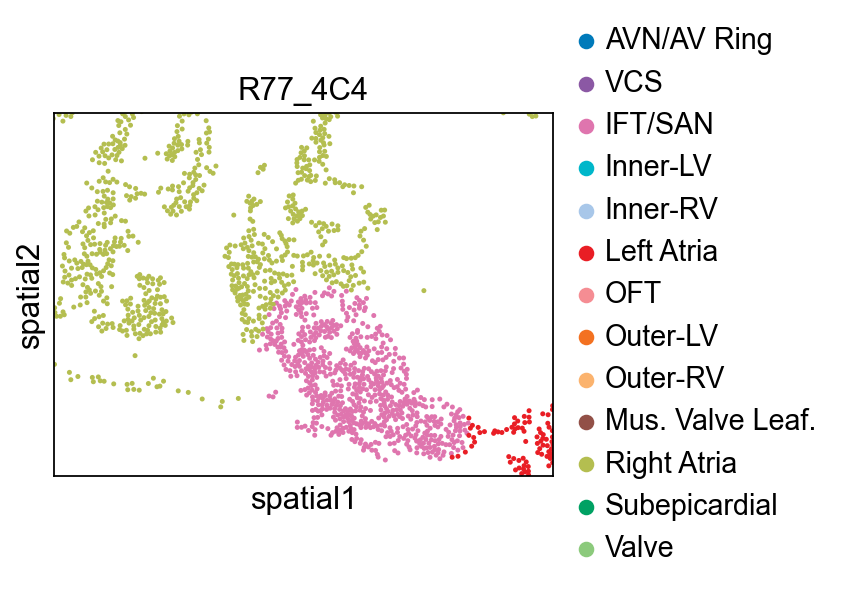

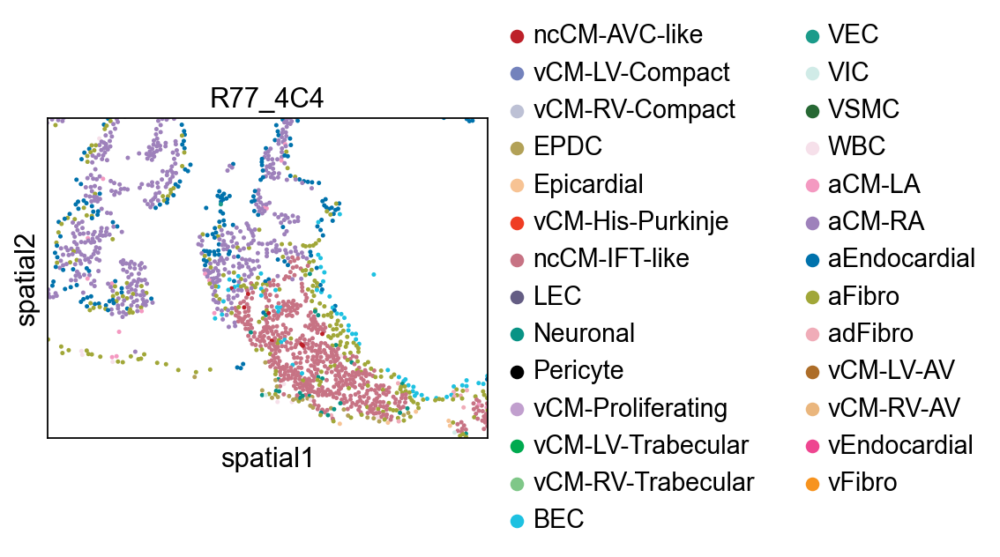

In [43]:
section_id = 'R77_4C4'
crop_coord = (-9700,-8600,900,1700)

slide = ndata[ndata.obs["sample_id"] == section_id].copy()

sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
plt.savefig(f'{figdir}/MERFISH_SAN-zoom_niche-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

sc.pl.spatial(
                slide,
                color=['communities'], ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
plt.savefig(f'{figdir}/MERFISH_SAN-zoom_communities-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

sc.pl.spatial(
                slide,
                color=['populations'], ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )

# Agreement with the author's niche annotation

- The author's niche annotations: "communities"

In [19]:
import pandas as pd
import numpy as np

from sklearn.metrics import cohen_kappa_score, accuracy_score, f1_score, confusion_matrix

# --------------------------------------------------
# Input variables
# --------------------------------------------------

pred_label_arr = ndata.obs["tt_final_label"].copy()
gt_label_arr = ndata.obs["communities"].copy()

df = pd.DataFrame({
    "pred_label": pred_label_arr,
    "groundtruth_label": gt_label_arr,
})

# --------------------------------------------------
# 1. Define harmonisation dictionaries
#    Map fine labels to shared anatomical labels
# --------------------------------------------------

pred_to_shared = {
    "Atrium - Left": "Atrium",
    "Atrium - Right": "Atrium",
    "Atrium - Transitional": "Atrium",

    "Sinus horn": "Sinoatrial region",
    "SA node - Head": "Sinoatrial region",
    "SA node - Tail": "Sinoatrial region",

    "AV nodal region": "AV junctional region",
    "AV ring": "AV junctional region",
    "Endocardial cushion - Valve": "AV junctional region",

    "Ventricle - Compact": "Ventricle - Outer",
    "Ventricle - Trabeculated": "Ventricle - Inner",
    "VCS - Proximal": "VCS",
    "VCS - Distal": "VCS",
    "Endocardium - Atrial": "Atrium",
    "Endocardium - Ventricular": "Ventricle - Inner",
    "Great vessel": "OFT - Great vessel",
    "Ductus arteriosus": "Ductus arteriosus",
    "Coronary vessel": "Coronary vessel",
    "Connective tissue": "Connective tissue",
    "Epicardial region": "Epicardial region",
}

groundtruth_to_shared = {
    'AVN/AV Ring': "AV junctional region",
     'IFT/SAN': "Sinoatrial region",
     'Inner-LV': "Ventricle - Inner",
     'Inner-RV': "Ventricle - Inner",
     'Left Atria': "Atrium",
     'Mus. Valve Leaf.': "AV junctional region",
     'OFT': "OFT - Great vessel",
     'Outer-LV': "Ventricle - Outer",
     'Outer-RV': "Ventricle - Outer",
     'Right Atria': "Atrium",
     'Subepicardial': "Epicardial region",
     'VCS': "VCS",
     'Valve': "AV junctional region",
}

# --------------------------------------------------
# 2. Apply mapping
# --------------------------------------------------

df["pred_shared"] = df["pred_label"].map(pred_to_shared)
df["groundtruth_shared"] = df["groundtruth_label"].map(groundtruth_to_shared)

# Check for unmapped labels
unmapped_pred = sorted(df.loc[df["pred_shared"].isna(), "pred_label"].dropna().unique())
unmapped_groundtruth = sorted(df.loc[df["groundtruth_shared"].isna(), "groundtruth_label"].dropna().unique())

if unmapped_pred:
    print("Unmapped predicted labels:", unmapped_pred)
if unmapped_groundtruth:
    print("Unmapped groundtruth labels:", unmapped_groundtruth)

# Keep only rows where both sides were successfully mapped
df_eval = df.dropna(subset=["pred_shared", "groundtruth_shared"]).copy()

# --------------------------------------------------
# 3. Define evaluation categories (clean + ordered)
# --------------------------------------------------

# All possible shared categories (order defined by pred_to_shared)
all_categories = list(dict.fromkeys(pred_to_shared.values()))

# Categories actually present after mapping
pred_present = set(df_eval["pred_shared"].unique())
gt_present = set(df_eval["groundtruth_shared"].unique())

# Report missing categories
missing_in_pred = set(all_categories) - pred_present
missing_in_gt = set(all_categories) - gt_present

print("All categories (ordered):", all_categories)
print("Missing in predictions:", sorted(missing_in_pred))
print("Missing in groundtruth:", sorted(missing_in_gt))

# Evaluation categories = ordered intersection
eval_categories = [c for c in all_categories if c in pred_present and c in gt_present]

print("Evaluation categories (used for metrics):", eval_categories)
print("n categories (all):", len(all_categories))
print("n categories (evaluated):", len(eval_categories))

# Restrict dataset to evaluation categories only
df_eval = df_eval[
    df_eval["pred_shared"].isin(eval_categories) &
    df_eval["groundtruth_shared"].isin(eval_categories)
].copy()

# Enforce categorical dtype to keep order stable
df_eval["pred_shared"] = pd.Categorical(
    df_eval["pred_shared"],
    categories=eval_categories,
    ordered=True
)
df_eval["groundtruth_shared"] = pd.Categorical(
    df_eval["groundtruth_shared"],
    categories=eval_categories,
    ordered=True
)

# --------------------------------------------------
# 4. Compute metrics
# --------------------------------------------------

y_true = df_eval["groundtruth_shared"].astype(str)
y_pred = df_eval["pred_shared"].astype(str)

kappa = cohen_kappa_score(y_true, y_pred)
acc = accuracy_score(y_true, y_pred)
macro_f1 = f1_score(y_true, y_pred, average="macro")
micro_f1 = f1_score(y_true, y_pred, average="micro")

print(f"Cohen's kappa: {kappa:.4f}")
print(f"Accuracy:      {acc:.4f}")
print(f"Macro F1:      {macro_f1:.4f}")
print(f"Micro F1:      {micro_f1:.4f}")

# --------------------------------------------------
# 5. Confusion matrix / cross-tab
# --------------------------------------------------

cm = confusion_matrix(y_true, y_pred, labels=eval_categories)
cm_df = pd.DataFrame(cm, index=eval_categories, columns=eval_categories)

print("\nConfusion matrix:")
print(cm_df)

# Row-normalised version (true groundtruth rows sum to 1)
cm_row_norm = cm_df.div(cm_df.sum(axis=1).replace(0, np.nan), axis=0)

print("\nRow-normalised confusion matrix:")
print(cm_row_norm)

# --------------------------------------------------
# 6. Permutation test for kappa
# --------------------------------------------------

from tqdm import tqdm
import numpy as np
from sklearn.metrics import cohen_kappa_score

def permutation_test_kappa(y_true, y_pred, n_perm=1000, random_state=0, show_progress=True):
    rng = np.random.default_rng(random_state)

    observed = cohen_kappa_score(y_true, y_pred)
    permuted = np.empty(n_perm)

    y_pred = np.asarray(y_pred)

    iterator = range(n_perm)
    if show_progress:
        iterator = tqdm(iterator, desc="Permutation test (kappa)")

    for i in iterator:
        y_pred_perm = rng.permutation(y_pred)
        permuted[i] = cohen_kappa_score(y_true, y_pred_perm)

    # one-sided p-value: how often permuted >= observed
    p_value = (np.sum(permuted >= observed) + 1) / (n_perm + 1)

    return observed, permuted, p_value

obs_kappa, perm_kappas, p_perm = permutation_test_kappa(
    y_true,
    y_pred,
    n_perm=1000,
    random_state=42
)

print("\nPermutation test for kappa:")
print(f"Observed kappa = {obs_kappa:.4f}")
print(f"P-value        = {p_perm:.6f}")

All categories (ordered): ['Atrium', 'Sinoatrial region', 'AV junctional region', 'Ventricle - Outer', 'Ventricle - Inner', 'VCS', 'OFT - Great vessel', 'Ductus arteriosus', 'Coronary vessel', 'Connective tissue', 'Epicardial region']
Missing in predictions: []
Missing in groundtruth: ['Connective tissue', 'Coronary vessel', 'Ductus arteriosus']
Evaluation categories (used for metrics): ['Atrium', 'Sinoatrial region', 'AV junctional region', 'Ventricle - Outer', 'Ventricle - Inner', 'VCS', 'OFT - Great vessel', 'Epicardial region']
n categories (all): 11
n categories (evaluated): 8
Cohen's kappa: 0.5161
Accuracy:      0.6440
Macro F1:      0.4824
Micro F1:      0.6440

Confusion matrix:
                      Atrium  Sinoatrial region  AV junctional region  \
Atrium                 22761               6173                  3882   
Sinoatrial region         65               3487                    48   
AV junctional region      54                356                  9952   
Ventricle - 

Permutation test (kappa): 100%|████████████████████████████████████████████████████| 1000/1000 [03:50<00:00,  4.35it/s]


Permutation test for kappa:
Observed kappa = 0.5161
P-value        = 0.000999


# Cross tabulation

In [20]:
obs = ndata.obs.copy()

In [21]:
obs['tt_final_label'] = (
    obs['tt_final_label']
    .astype('category')
    .cat.reorder_categories([
        'Atrium - Left',
        'Atrium - Right',
        'Atrium - Transitional',
        'Endocardium - Atrial',
        'Sinus horn',
        'SA node - Head',
        'SA node - Tail',
        'AV nodal region',
        'AV ring',
        'Endocardial cushion - Valve',
        'Ventricle - Compact',
        'Ventricle - Trabeculated',
        'VCS - Proximal',
        'VCS - Distal',
        'Endocardium - Ventricular',
        'Great vessel',
        'Ductus arteriosus',
        'Coronary vessel',
        'Connective tissue',
        'Epicardial region'
    ], ordered=True))

obs['communities'] = (
    obs['communities']
    .astype('category')
    .cat.reorder_categories([
        'Left Atria',
        'Right Atria',
        'IFT/SAN',
        'AVN/AV Ring',
        'Valve',
        'Mus. Valve Leaf.',
        'Outer-LV',
        'Outer-RV',
        'Inner-LV',
        'Inner-RV',
        'VCS',
        'OFT',
        'Subepicardial' 
    ], ordered=True))

In [22]:
obs['tt_final_label'].value_counts()

tt_final_label
Ventricle - Compact            97611
AV nodal region                18550
Atrium - Left                  16266
Epicardial region              14992
Sinus horn                     11933
VCS - Proximal                 10391
Atrium - Right                  5932
Endocardium - Ventricular       5095
Ventricle - Trabeculated        4725
VCS - Distal                    2627
Coronary vessel                 1618
Ductus arteriosus               1574
Great vessel                    1049
Endocardium - Atrial             670
Endocardial cushion - Valve      453
Connective tissue                324
Atrium - Transitional            149
SA node - Tail                   116
SA node - Head                   110
AV ring                            6
Name: count, dtype: int64

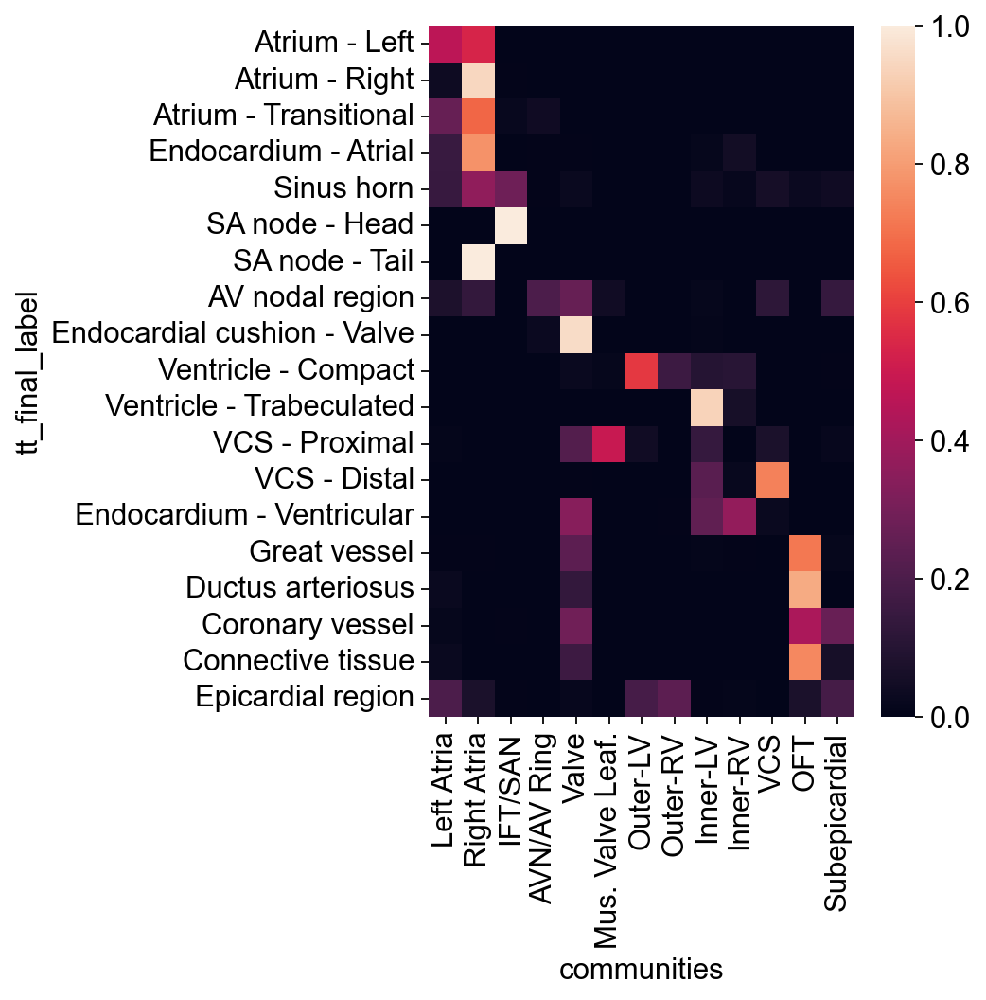

In [23]:
n_thresh = 10
val_counts = obs['tt_final_label'].value_counts()
label_keep = val_counts.index[val_counts>n_thresh]
obs_sel = obs[obs['tt_final_label'].isin(list(label_keep))]

plt.figure(figsize=(4.5, 6))
df = pd.crosstab(obs_sel['tt_final_label'],
                 obs_sel['communities'],
                 normalize='index')
sns.heatmap(df)
plt.grid(False)
plt.savefig(f'{figdir}/MERFISH_crosstab_TTlabel-original.pdf', bbox_inches="tight",dpi=300)
plt.show()